# Libraries

In [24]:
import math
import os
import numpy as np
import matplotlib.pyplot as plt
from glob import glob

# Requires TensorFlow >=2.11 for the GroupNormalization layer.
import tensorflow as tf
from tensorflow import keras
from tensorflow.keras import layers
import tensorflow_datasets as tfds

# Hyperparameters

In [25]:
batch_size = 32
num_epochs = 30  # Just for the sake of demonstration
total_timesteps = 1000
norm_groups = 8  # Number of groups used in GroupNormalization layer
learning_rate = 2e-4

img_size = 64
img_channels = 3
clip_min = -1.0
clip_max = 1.0

first_conv_channels = 64
channel_multiplier = [1, 2, 4, 8]
widths = [first_conv_channels * mult for mult in channel_multiplier]
has_attention = [False, False, True, True]
num_res_blocks = 2  # Number of residual blocks

# Dataset

In [26]:
dataset_path = "/kaggle/input/diffusion-data/Samples"
npy_files = sorted(glob(os.path.join(dataset_path, "*.npy")))

def augment(img):
    return tf.image.random_flip_left_right(img)

def resize_and_rescale(img, size):
    img = tf.image.resize(img, size=size, antialias=True)
    img = img * 2.0 - 1.0  # from [0,1] to [-1,1]
    img = tf.clip_by_value(img, clip_min, clip_max)
    return img

def load_and_process_npy(path):
    # Load and process .npy file
    img = np.load(path.numpy().decode("utf-8"))  # shape: (1, 150, 150)
    img = np.squeeze(img, axis=0)                # shape: (150, 150)
    img = np.stack([img] * 3, axis=-1)           # shape: (150, 150, 3)
    img = tf.convert_to_tensor(img, dtype=tf.float32)
    img = resize_and_rescale(img, size=(img_size, img_size))
    img = augment(img)
    return img

def tf_wrapper(path):
    img = tf.py_function(load_and_process_npy, inp=[path], Tout=tf.float32)
    img.set_shape([img_size, img_size, 3])
    return img

# Build dataset
ds = tf.data.Dataset.from_tensor_slices(npy_files)
train_ds = (
    ds.map(tf_wrapper, num_parallel_calls=tf.data.AUTOTUNE)
      .batch(batch_size, drop_remainder=True)
      .shuffle(batch_size * 2)
      .prefetch(tf.data.AUTOTUNE)
)

In [27]:
# for batch in train_ds.take(1):
#     for i in range(5):
#         img = (batch[i].numpy() + 1.0) / 2.0  # back to [0, 1]
#         plt.imshow(img)
#         plt.axis("off")
#         plt.show()

# Gaussian diffusion utilities

In [28]:
class GaussianDiffusion:
    """Gaussian diffusion utility.

    Args:
        beta_start: Start value of the scheduled variance
        beta_end: End value of the scheduled variance
        timesteps: Number of time steps in the forward process
    """

    def __init__(
        self,
        beta_start=1e-4,
        beta_end=0.02,
        timesteps=1000,
        clip_min=-1.0,
        clip_max=1.0,
    ):
        self.beta_start = beta_start
        self.beta_end = beta_end
        self.timesteps = timesteps
        self.clip_min = clip_min
        self.clip_max = clip_max

        # Define the linear variance schedule
        self.betas = betas = np.linspace(
            beta_start,
            beta_end,
            timesteps,
            dtype=np.float64,  # Using float64 for better precision
        )
        self.num_timesteps = int(timesteps)

        alphas = 1.0 - betas
        alphas_cumprod = np.cumprod(alphas, axis=0)
        alphas_cumprod_prev = np.append(1.0, alphas_cumprod[:-1])

        self.betas = tf.constant(betas, dtype=tf.float32)
        self.alphas_cumprod = tf.constant(alphas_cumprod, dtype=tf.float32)
        self.alphas_cumprod_prev = tf.constant(alphas_cumprod_prev, dtype=tf.float32)

        # Calculations for diffusion q(x_t | x_{t-1}) and others
        self.sqrt_alphas_cumprod = tf.constant(
            np.sqrt(alphas_cumprod), dtype=tf.float32
        )

        self.sqrt_one_minus_alphas_cumprod = tf.constant(
            np.sqrt(1.0 - alphas_cumprod), dtype=tf.float32
        )

        self.log_one_minus_alphas_cumprod = tf.constant(
            np.log(1.0 - alphas_cumprod), dtype=tf.float32
        )

        self.sqrt_recip_alphas_cumprod = tf.constant(
            np.sqrt(1.0 / alphas_cumprod), dtype=tf.float32
        )
        self.sqrt_recipm1_alphas_cumprod = tf.constant(
            np.sqrt(1.0 / alphas_cumprod - 1), dtype=tf.float32
        )

        # Calculations for posterior q(x_{t-1} | x_t, x_0)
        posterior_variance = (
            betas * (1.0 - alphas_cumprod_prev) / (1.0 - alphas_cumprod)
        )
        self.posterior_variance = tf.constant(posterior_variance, dtype=tf.float32)

        # Log calculation clipped because the posterior variance is 0 at the beginning
        # of the diffusion chain
        self.posterior_log_variance_clipped = tf.constant(
            np.log(np.maximum(posterior_variance, 1e-20)), dtype=tf.float32
        )

        self.posterior_mean_coef1 = tf.constant(
            betas * np.sqrt(alphas_cumprod_prev) / (1.0 - alphas_cumprod),
            dtype=tf.float32,
        )

        self.posterior_mean_coef2 = tf.constant(
            (1.0 - alphas_cumprod_prev) * np.sqrt(alphas) / (1.0 - alphas_cumprod),
            dtype=tf.float32,
        )

    def _extract(self, a, t, x_shape):
        """Extract some coefficients at specified timesteps,
        then reshape to [batch_size, 1, 1, 1, 1, ...] for broadcasting purposes.

        Args:
            a: Tensor to extract from
            t: Timestep for which the coefficients are to be extracted
            x_shape: Shape of the current batched samples
        """
        batch_size = x_shape[0]
        out = tf.gather(a, t)
        return tf.reshape(out, [batch_size, 1, 1, 1])

    def q_mean_variance(self, x_start, t):
        """Extracts the mean, and the variance at current timestep.

        Args:
            x_start: Initial sample (before the first diffusion step)
            t: Current timestep
        """
        x_start_shape = tf.shape(x_start)
        mean = self._extract(self.sqrt_alphas_cumprod, t, x_start_shape) * x_start
        variance = self._extract(1.0 - self.alphas_cumprod, t, x_start_shape)
        log_variance = self._extract(
            self.log_one_minus_alphas_cumprod, t, x_start_shape
        )
        return mean, variance, log_variance

    def q_sample(self, x_start, t, noise):
        """Diffuse the data.

        Args:
            x_start: Initial sample (before the first diffusion step)
            t: Current timestep
            noise: Gaussian noise to be added at the current timestep
        Returns:
            Diffused samples at timestep `t`
        """
        x_start_shape = tf.shape(x_start)
        return (
            self._extract(self.sqrt_alphas_cumprod, t, tf.shape(x_start)) * x_start
            + self._extract(self.sqrt_one_minus_alphas_cumprod, t, x_start_shape)
            * noise
        )

    def predict_start_from_noise(self, x_t, t, noise):
        x_t_shape = tf.shape(x_t)
        return (
            self._extract(self.sqrt_recip_alphas_cumprod, t, x_t_shape) * x_t
            - self._extract(self.sqrt_recipm1_alphas_cumprod, t, x_t_shape) * noise
        )

    def q_posterior(self, x_start, x_t, t):
        """Compute the mean and variance of the diffusion
        posterior q(x_{t-1} | x_t, x_0).

        Args:
            x_start: Stating point(sample) for the posterior computation
            x_t: Sample at timestep `t`
            t: Current timestep
        Returns:
            Posterior mean and variance at current timestep
        """

        x_t_shape = tf.shape(x_t)
        posterior_mean = (
            self._extract(self.posterior_mean_coef1, t, x_t_shape) * x_start
            + self._extract(self.posterior_mean_coef2, t, x_t_shape) * x_t
        )
        posterior_variance = self._extract(self.posterior_variance, t, x_t_shape)
        posterior_log_variance_clipped = self._extract(
            self.posterior_log_variance_clipped, t, x_t_shape
        )
        return posterior_mean, posterior_variance, posterior_log_variance_clipped

    def p_mean_variance(self, pred_noise, x, t, clip_denoised=True):
        x_recon = self.predict_start_from_noise(x, t=t, noise=pred_noise)
        if clip_denoised:
            x_recon = tf.clip_by_value(x_recon, self.clip_min, self.clip_max)

        model_mean, posterior_variance, posterior_log_variance = self.q_posterior(
            x_start=x_recon, x_t=x, t=t
        )
        return model_mean, posterior_variance, posterior_log_variance

    def p_sample(self, pred_noise, x, t, clip_denoised=True):
        """Sample from the diffusion model.

        Args:
            pred_noise: Noise predicted by the diffusion model
            x: Samples at a given timestep for which the noise was predicted
            t: Current timestep
            clip_denoised (bool): Whether to clip the predicted noise
                within the specified range or not.
        """
        model_mean, _, model_log_variance = self.p_mean_variance(
            pred_noise, x=x, t=t, clip_denoised=clip_denoised
        )
        noise = tf.random.normal(shape=x.shape, dtype=x.dtype)
        # No noise when t == 0
        nonzero_mask = tf.reshape(
            1 - tf.cast(tf.equal(t, 0), tf.float32), [tf.shape(x)[0], 1, 1, 1]
        )
        return model_mean + nonzero_mask * tf.exp(0.5 * model_log_variance) * noise



# Network architecture

In [29]:
# Kernel initializer to use
def kernel_init(scale):
    scale = max(scale, 1e-10)
    return keras.initializers.VarianceScaling(
        scale, mode="fan_avg", distribution="uniform"
    )


class AttentionBlock(layers.Layer):
    """Applies self-attention.

    Args:
        units: Number of units in the dense layers
        groups: Number of groups to be used for GroupNormalization layer
    """

    def __init__(self, units, groups=8, **kwargs):
        self.units = units
        self.groups = groups
        super().__init__(**kwargs)

        self.norm = layers.GroupNormalization(groups=groups)
        self.query = layers.Dense(units, kernel_initializer=kernel_init(1.0))
        self.key = layers.Dense(units, kernel_initializer=kernel_init(1.0))
        self.value = layers.Dense(units, kernel_initializer=kernel_init(1.0))
        self.proj = layers.Dense(units, kernel_initializer=kernel_init(0.0))

    def call(self, inputs):
        batch_size = tf.shape(inputs)[0]
        height = tf.shape(inputs)[1]
        width = tf.shape(inputs)[2]
        scale = tf.cast(self.units, tf.float32) ** (-0.5)

        inputs = self.norm(inputs)
        q = self.query(inputs)
        k = self.key(inputs)
        v = self.value(inputs)

        attn_score = tf.einsum("bhwc, bHWc->bhwHW", q, k) * scale
        attn_score = tf.reshape(attn_score, [batch_size, height, width, height * width])

        attn_score = tf.nn.softmax(attn_score, -1)
        attn_score = tf.reshape(attn_score, [batch_size, height, width, height, width])

        proj = tf.einsum("bhwHW,bHWc->bhwc", attn_score, v)
        proj = self.proj(proj)
        return inputs + proj


class TimeEmbedding(layers.Layer):
    def __init__(self, dim, **kwargs):
        super().__init__(**kwargs)
        self.dim = dim
        self.half_dim = dim // 2
        self.emb = math.log(10000) / (self.half_dim - 1)
        self.emb = tf.exp(tf.range(self.half_dim, dtype=tf.float32) * -self.emb)

    def call(self, inputs):
        inputs = tf.cast(inputs, dtype=tf.float32)
        emb = inputs[:, None] * self.emb[None, :]
        emb = tf.concat([tf.sin(emb), tf.cos(emb)], axis=-1)
        return emb


def ResidualBlock(width, groups=8, activation_fn=keras.activations.swish):
    def apply(inputs):
        x, t = inputs
        input_width = x.shape[3]

        if input_width == width:
            residual = x
        else:
            residual = layers.Conv2D(
                width, kernel_size=1, kernel_initializer=kernel_init(1.0)
            )(x)

        temb = activation_fn(t)
        temb = layers.Dense(width, kernel_initializer=kernel_init(1.0))(temb)[
            :, None, None, :
        ]

        x = layers.GroupNormalization(groups=groups)(x)
        x = activation_fn(x)
        x = layers.Conv2D(
            width, kernel_size=3, padding="same", kernel_initializer=kernel_init(1.0)
        )(x)

        x = layers.Add()([x, temb])
        x = layers.GroupNormalization(groups=groups)(x)
        x = activation_fn(x)

        x = layers.Conv2D(
            width, kernel_size=3, padding="same", kernel_initializer=kernel_init(0.0)
        )(x)
        x = layers.Add()([x, residual])
        return x

    return apply


def DownSample(width):
    def apply(x):
        x = layers.Conv2D(
            width,
            kernel_size=3,
            strides=2,
            padding="same",
            kernel_initializer=kernel_init(1.0),
        )(x)
        return x

    return apply


def UpSample(width, interpolation="nearest"):
    def apply(x):
        x = layers.UpSampling2D(size=2, interpolation=interpolation)(x)
        x = layers.Conv2D(
            width, kernel_size=3, padding="same", kernel_initializer=kernel_init(1.0)
        )(x)
        return x

    return apply


def TimeMLP(units, activation_fn=keras.activations.swish):
    def apply(inputs):
        temb = layers.Dense(
            units, activation=activation_fn, kernel_initializer=kernel_init(1.0)
        )(inputs)
        temb = layers.Dense(units, kernel_initializer=kernel_init(1.0))(temb)
        return temb

    return apply


def build_model(
    img_size,
    img_channels,
    widths,
    has_attention,
    num_res_blocks=2,
    norm_groups=8,
    interpolation="nearest",
    activation_fn=keras.activations.swish,
):
    image_input = layers.Input(
        shape=(img_size, img_size, img_channels), name="image_input"
    )
    time_input = keras.Input(shape=(), dtype=tf.int64, name="time_input")

    x = layers.Conv2D(
        first_conv_channels,
        kernel_size=(3, 3),
        padding="same",
        kernel_initializer=kernel_init(1.0),
    )(image_input)

    temb = TimeEmbedding(dim=first_conv_channels * 4)(time_input)
    temb = TimeMLP(units=first_conv_channels * 4, activation_fn=activation_fn)(temb)

    skips = [x]

    # DownBlock
    for i in range(len(widths)):
        for _ in range(num_res_blocks):
            x = ResidualBlock(
                widths[i], groups=norm_groups, activation_fn=activation_fn
            )([x, temb])
            if has_attention[i]:
                x = AttentionBlock(widths[i], groups=norm_groups)(x)
            skips.append(x)

        if widths[i] != widths[-1]:
            x = DownSample(widths[i])(x)
            skips.append(x)

    # MiddleBlock
    x = ResidualBlock(widths[-1], groups=norm_groups, activation_fn=activation_fn)(
        [x, temb]
    )
    x = AttentionBlock(widths[-1], groups=norm_groups)(x)
    x = ResidualBlock(widths[-1], groups=norm_groups, activation_fn=activation_fn)(
        [x, temb]
    )

    # UpBlock
    for i in reversed(range(len(widths))):
        for _ in range(num_res_blocks + 1):
            x = layers.Concatenate(axis=-1)([x, skips.pop()])
            x = ResidualBlock(
                widths[i], groups=norm_groups, activation_fn=activation_fn
            )([x, temb])
            if has_attention[i]:
                x = AttentionBlock(widths[i], groups=norm_groups)(x)

        if i != 0:
            x = UpSample(widths[i], interpolation=interpolation)(x)

    # End block
    x = layers.GroupNormalization(groups=norm_groups)(x)
    x = activation_fn(x)
    x = layers.Conv2D(3, (3, 3), padding="same", kernel_initializer=kernel_init(0.0))(x)
    return keras.Model([image_input, time_input], x, name="unet")


In [30]:
class DiffusionModel(keras.Model):
    def __init__(self, network, ema_network, timesteps, gdf_util, ema=0.999):
        super().__init__()
        self.network = network
        self.ema_network = ema_network
        self.timesteps = timesteps
        self.gdf_util = gdf_util
        self.ema = ema

    def train_step(self, images):
        # 1. Get the batch size
        batch_size = tf.shape(images)[0]

        # 2. Sample timesteps uniformly
        t = tf.random.uniform(
            minval=0, maxval=self.timesteps, shape=(batch_size,), dtype=tf.int64
        )

        with tf.GradientTape() as tape:
            # 3. Sample random noise to be added to the images in the batch
            noise = tf.random.normal(shape=tf.shape(images), dtype=images.dtype)

            # 4. Diffuse the images with noise
            images_t = self.gdf_util.q_sample(images, t, noise)

            # 5. Pass the diffused images and time steps to the network
            pred_noise = self.network([images_t, t], training=True)

            # 6. Calculate the loss
            loss = self.loss(noise, pred_noise)

        # 7. Get the gradients
        gradients = tape.gradient(loss, self.network.trainable_weights)

        # 8. Update the weights of the network
        self.optimizer.apply_gradients(zip(gradients, self.network.trainable_weights))

        # 9. Updates the weight values for the network with EMA weights
        for weight, ema_weight in zip(self.network.weights, self.ema_network.weights):
            ema_weight.assign(self.ema * ema_weight + (1 - self.ema) * weight)

        # 10. Return loss values
        return {"loss": loss}

    def generate_images(self, num_images=16):
        # 1. Randomly sample noise (starting point for reverse process)
        samples = tf.random.normal(
            shape=(num_images, img_size, img_size, img_channels), dtype=tf.float32
        )
        # 2. Sample from the model iteratively
        for t in reversed(range(0, self.timesteps)):
            tt = tf.cast(tf.fill(num_images, t), dtype=tf.int64)
            pred_noise = self.ema_network.predict(
                [samples, tt], verbose=0, batch_size=num_images
            )
            samples = self.gdf_util.p_sample(
                pred_noise, samples, tt, clip_denoised=True
            )
        # 3. Return generated samples
        return samples

    def plot_images(
        self, epoch=None, logs=None, num_rows=2, num_cols=8, figsize=(12, 5)
    ):
        """Utility to plot images using the diffusion model during training."""
        generated_samples = self.generate_images(num_images=num_rows * num_cols)
        generated_samples = (
            tf.clip_by_value(generated_samples * 127.5 + 127.5, 0.0, 255.0)
            .numpy()
            .astype(np.uint8)
        )

        _, ax = plt.subplots(num_rows, num_cols, figsize=figsize)
        for i, image in enumerate(generated_samples):
            if num_rows == 1:
                ax[i].imshow(image)
                ax[i].axis("off")
            else:
                ax[i // num_cols, i % num_cols].imshow(image)
                ax[i // num_cols, i % num_cols].axis("off")

        plt.tight_layout()
        plt.show()


# Build the unet model
network = build_model(
    img_size=img_size,
    img_channels=img_channels,
    widths=widths,
    has_attention=has_attention,
    num_res_blocks=num_res_blocks,
    norm_groups=norm_groups,
    activation_fn=keras.activations.swish,
)
ema_network = build_model(
    img_size=img_size,
    img_channels=img_channels,
    widths=widths,
    has_attention=has_attention,
    num_res_blocks=num_res_blocks,
    norm_groups=norm_groups,
    activation_fn=keras.activations.swish,
)
ema_network.set_weights(network.get_weights())  # Initially the weights are the same

# Get an instance of the Gaussian Diffusion utilities
gdf_util = GaussianDiffusion(timesteps=total_timesteps)

# Training

Epoch 1/30
312/312 ━━━━━━━━━━━━━━━━━━━━ 0s 376ms/step - loss: 0.1263

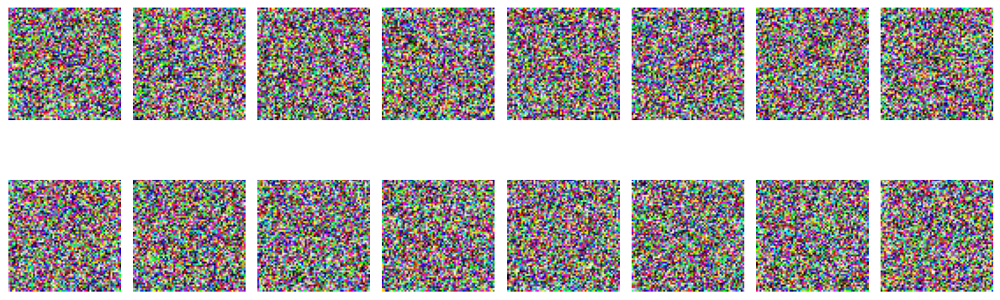

312/312 ━━━━━━━━━━━━━━━━━━━━ 339s 750ms/step - loss: 0.1259
Epoch 2/30
312/312 ━━━━━━━━━━━━━━━━━━━━ 0s 390ms/step - loss: 0.0066

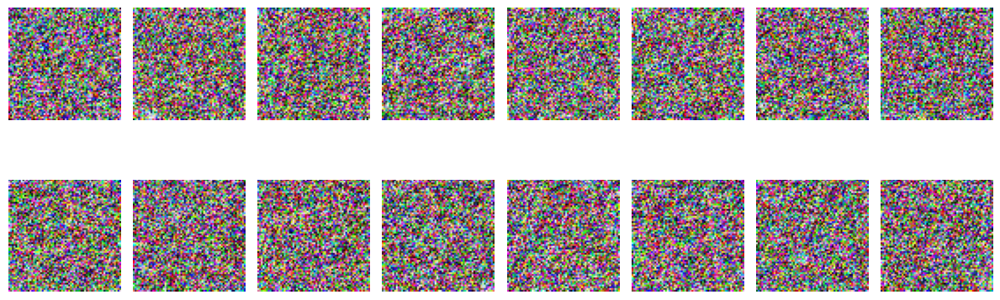

312/312 ━━━━━━━━━━━━━━━━━━━━ 239s 736ms/step - loss: 0.0066
Epoch 3/30
312/312 ━━━━━━━━━━━━━━━━━━━━ 0s 386ms/step - loss: 0.0048

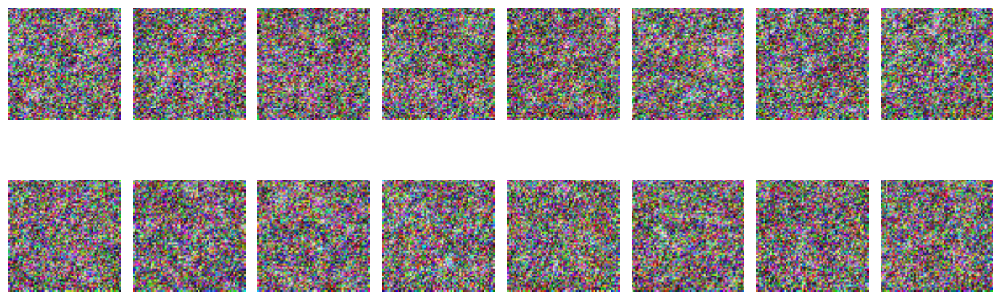

312/312 ━━━━━━━━━━━━━━━━━━━━ 240s 738ms/step - loss: 0.0048
Epoch 4/30
312/312 ━━━━━━━━━━━━━━━━━━━━ 0s 373ms/step - loss: 0.0037

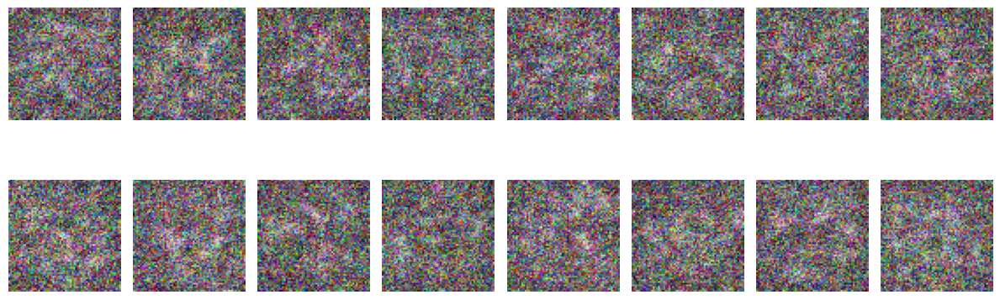

312/312 ━━━━━━━━━━━━━━━━━━━━ 233s 720ms/step - loss: 0.0037
Epoch 5/30
312/312 ━━━━━━━━━━━━━━━━━━━━ 0s 375ms/step - loss: 0.0032

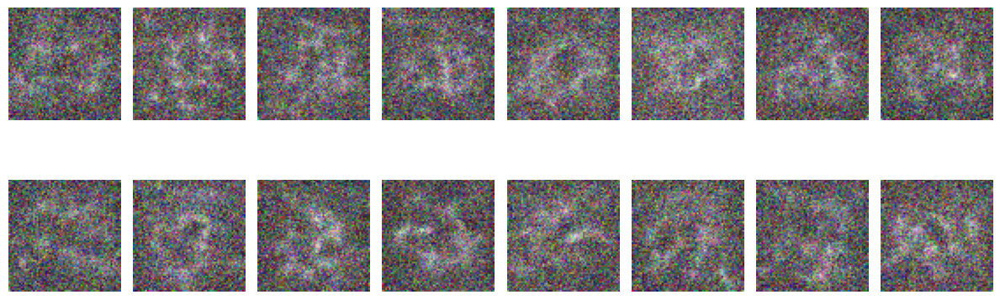

312/312 ━━━━━━━━━━━━━━━━━━━━ 233s 720ms/step - loss: 0.0032
Epoch 6/30
312/312 ━━━━━━━━━━━━━━━━━━━━ 0s 373ms/step - loss: 0.0029

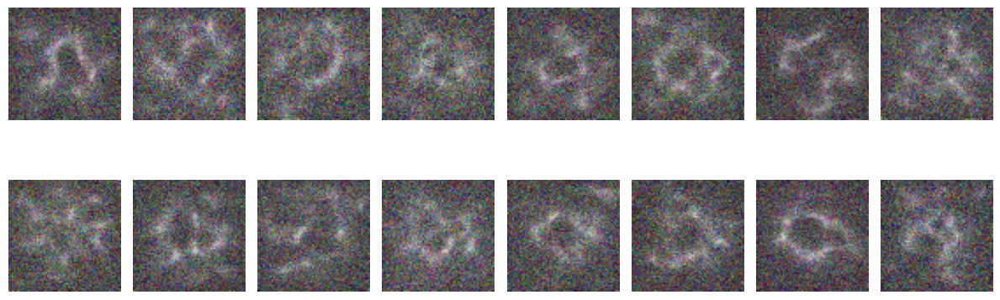

312/312 ━━━━━━━━━━━━━━━━━━━━ 232s 718ms/step - loss: 0.0029
Epoch 7/30
312/312 ━━━━━━━━━━━━━━━━━━━━ 0s 372ms/step - loss: 0.0026

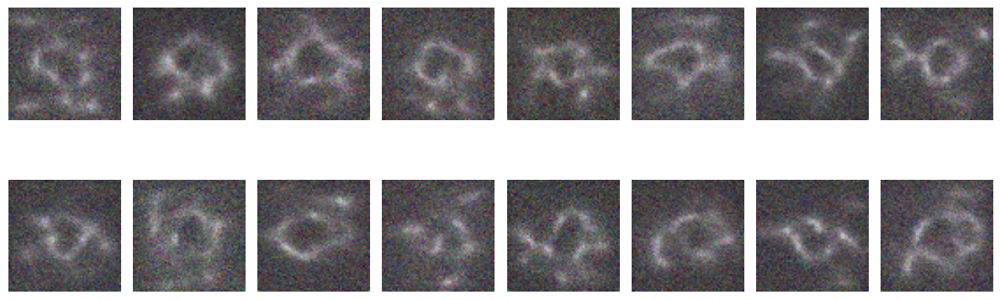

312/312 ━━━━━━━━━━━━━━━━━━━━ 232s 715ms/step - loss: 0.0026
Epoch 8/30
312/312 ━━━━━━━━━━━━━━━━━━━━ 0s 372ms/step - loss: 0.0024

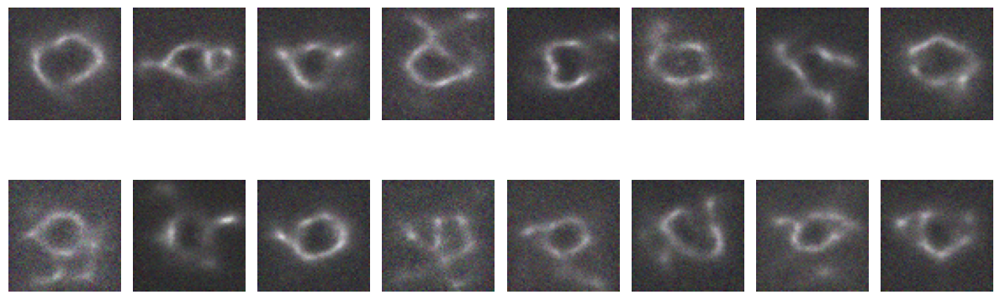

312/312 ━━━━━━━━━━━━━━━━━━━━ 236s 731ms/step - loss: 0.0024
Epoch 9/30
312/312 ━━━━━━━━━━━━━━━━━━━━ 0s 370ms/step - loss: 0.0027

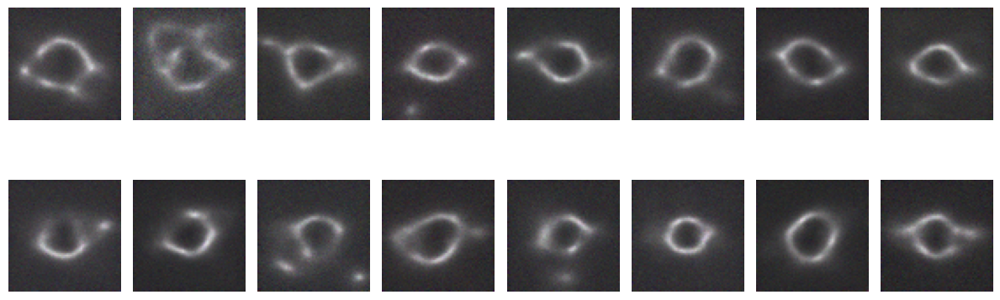

312/312 ━━━━━━━━━━━━━━━━━━━━ 228s 704ms/step - loss: 0.0027
Epoch 10/30
312/312 ━━━━━━━━━━━━━━━━━━━━ 0s 367ms/step - loss: 0.0020

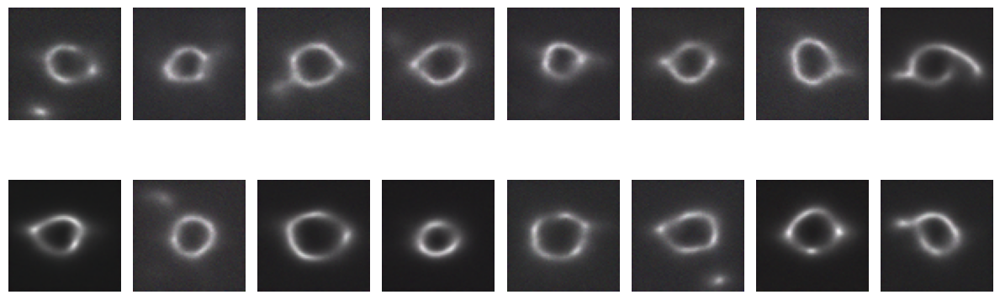

312/312 ━━━━━━━━━━━━━━━━━━━━ 226s 699ms/step - loss: 0.0020
Epoch 11/30
312/312 ━━━━━━━━━━━━━━━━━━━━ 0s 373ms/step - loss: 0.0023

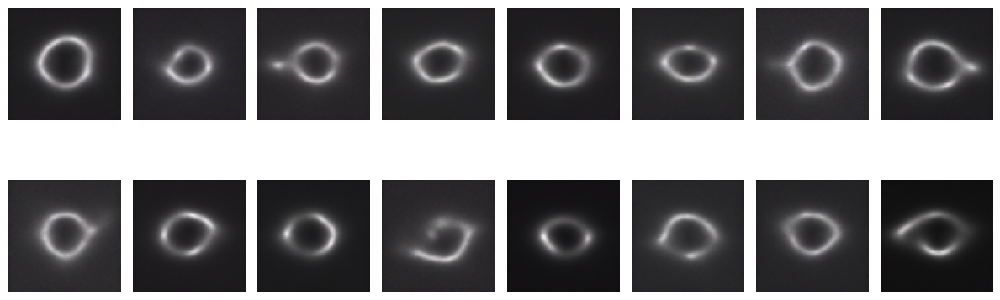

312/312 ━━━━━━━━━━━━━━━━━━━━ 232s 713ms/step - loss: 0.0023
Epoch 12/30
312/312 ━━━━━━━━━━━━━━━━━━━━ 0s 370ms/step - loss: 0.0020

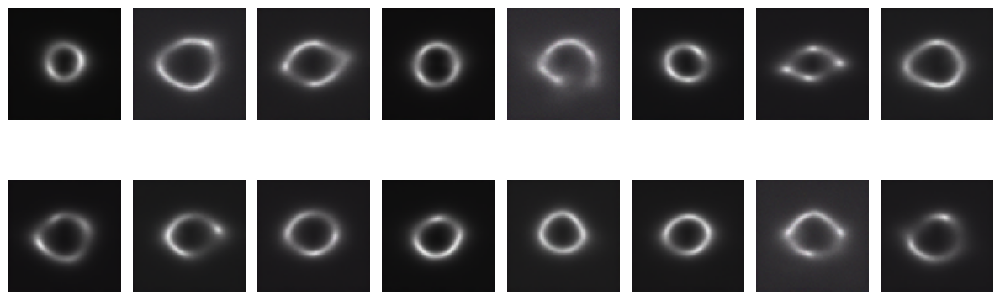

312/312 ━━━━━━━━━━━━━━━━━━━━ 230s 710ms/step - loss: 0.0019
Epoch 13/30
312/312 ━━━━━━━━━━━━━━━━━━━━ 0s 372ms/step - loss: 0.0018

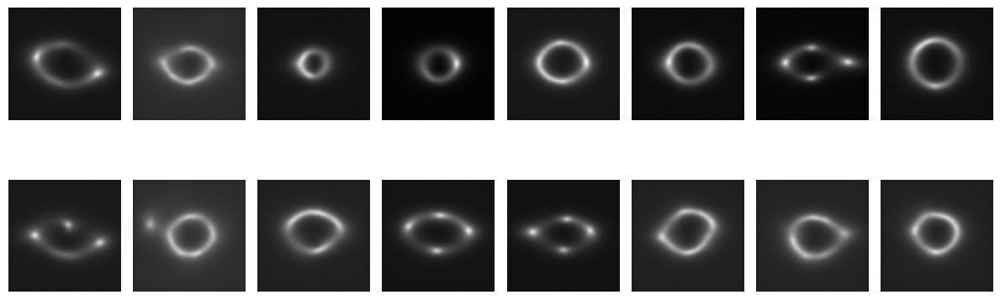

312/312 ━━━━━━━━━━━━━━━━━━━━ 235s 719ms/step - loss: 0.0018
Epoch 14/30
312/312 ━━━━━━━━━━━━━━━━━━━━ 0s 376ms/step - loss: 0.0020

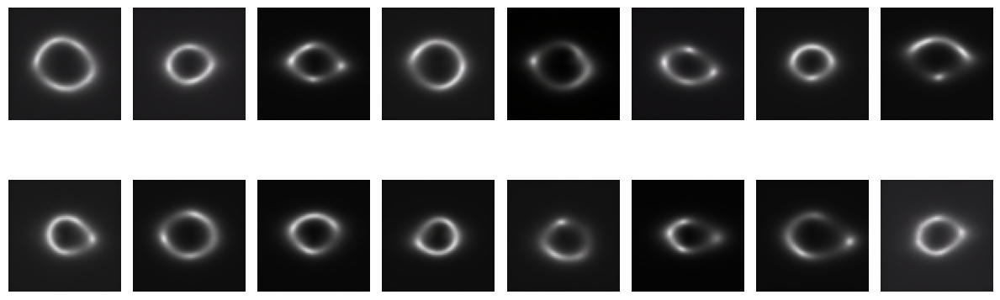

312/312 ━━━━━━━━━━━━━━━━━━━━ 233s 715ms/step - loss: 0.0020
Epoch 15/30
312/312 ━━━━━━━━━━━━━━━━━━━━ 0s 372ms/step - loss: 0.0018

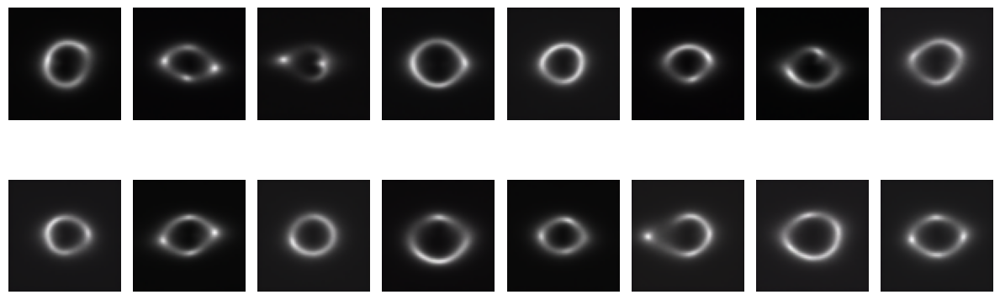

312/312 ━━━━━━━━━━━━━━━━━━━━ 231s 711ms/step - loss: 0.0018
Epoch 16/30
312/312 ━━━━━━━━━━━━━━━━━━━━ 0s 373ms/step - loss: 0.0017

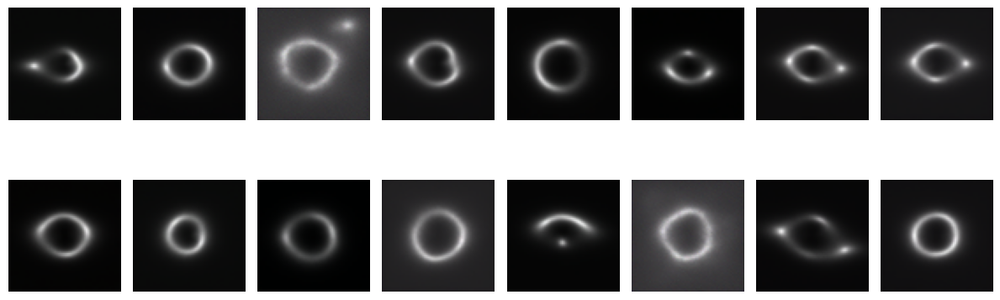

312/312 ━━━━━━━━━━━━━━━━━━━━ 230s 709ms/step - loss: 0.0017
Epoch 17/30
312/312 ━━━━━━━━━━━━━━━━━━━━ 0s 372ms/step - loss: 0.0021

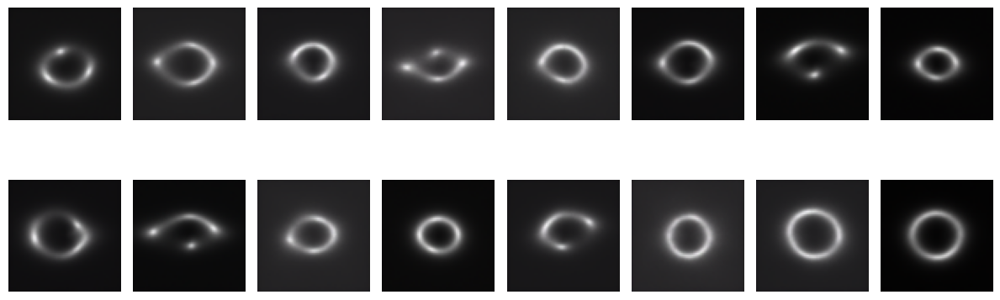

312/312 ━━━━━━━━━━━━━━━━━━━━ 231s 712ms/step - loss: 0.0021
Epoch 18/30
312/312 ━━━━━━━━━━━━━━━━━━━━ 0s 373ms/step - loss: 0.0019

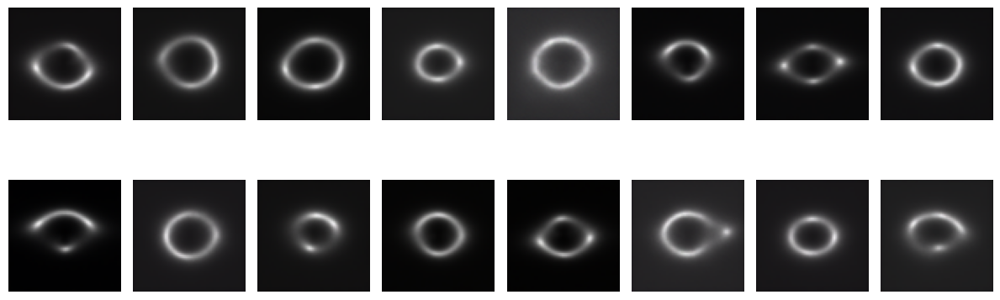

312/312 ━━━━━━━━━━━━━━━━━━━━ 233s 722ms/step - loss: 0.0019
Epoch 19/30
312/312 ━━━━━━━━━━━━━━━━━━━━ 0s 375ms/step - loss: 0.0016

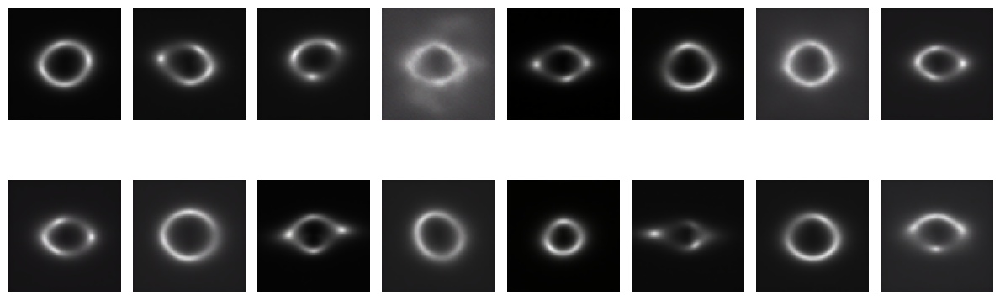

312/312 ━━━━━━━━━━━━━━━━━━━━ 232s 717ms/step - loss: 0.0016
Epoch 20/30
312/312 ━━━━━━━━━━━━━━━━━━━━ 0s 372ms/step - loss: 0.0015

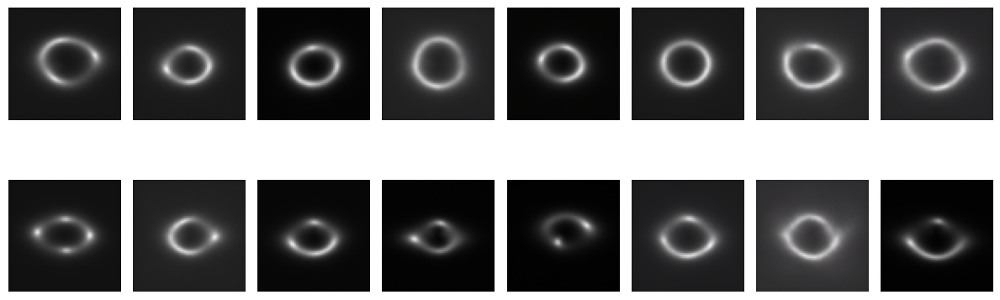

312/312 ━━━━━━━━━━━━━━━━━━━━ 231s 713ms/step - loss: 0.0014
Epoch 21/30
312/312 ━━━━━━━━━━━━━━━━━━━━ 0s 372ms/step - loss: 0.0017

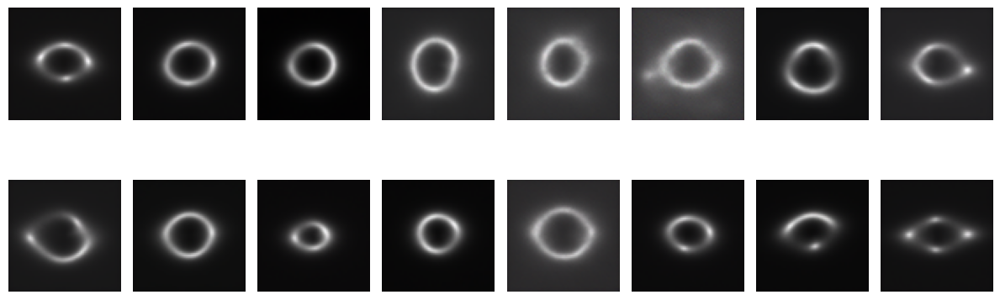

312/312 ━━━━━━━━━━━━━━━━━━━━ 231s 712ms/step - loss: 0.0017
Epoch 22/30
312/312 ━━━━━━━━━━━━━━━━━━━━ 0s 371ms/step - loss: 0.0016

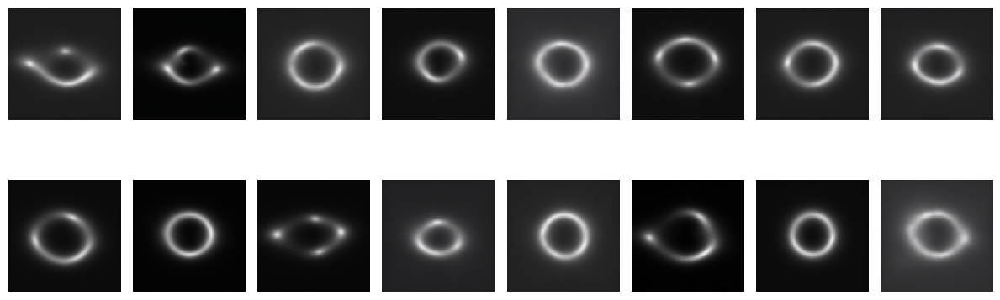

312/312 ━━━━━━━━━━━━━━━━━━━━ 231s 714ms/step - loss: 0.0016
Epoch 23/30
312/312 ━━━━━━━━━━━━━━━━━━━━ 0s 376ms/step - loss: 0.0016

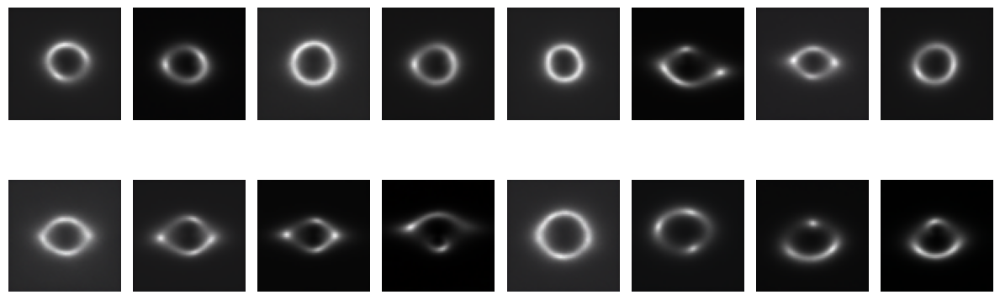

312/312 ━━━━━━━━━━━━━━━━━━━━ 235s 725ms/step - loss: 0.0016
Epoch 24/30
312/312 ━━━━━━━━━━━━━━━━━━━━ 0s 373ms/step - loss: 0.0016

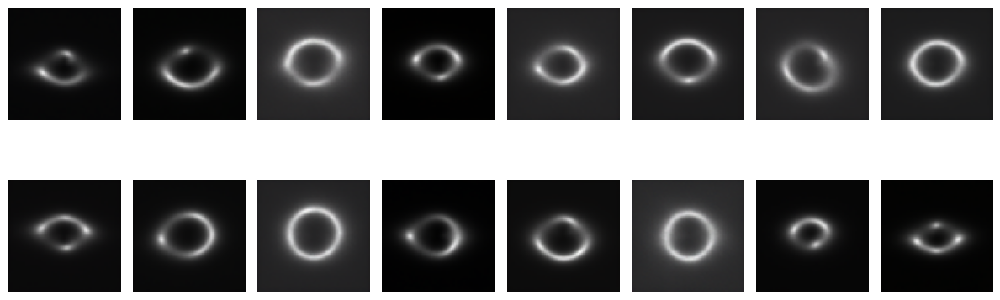

312/312 ━━━━━━━━━━━━━━━━━━━━ 232s 716ms/step - loss: 0.0016
Epoch 25/30
312/312 ━━━━━━━━━━━━━━━━━━━━ 0s 371ms/step - loss: 0.0017

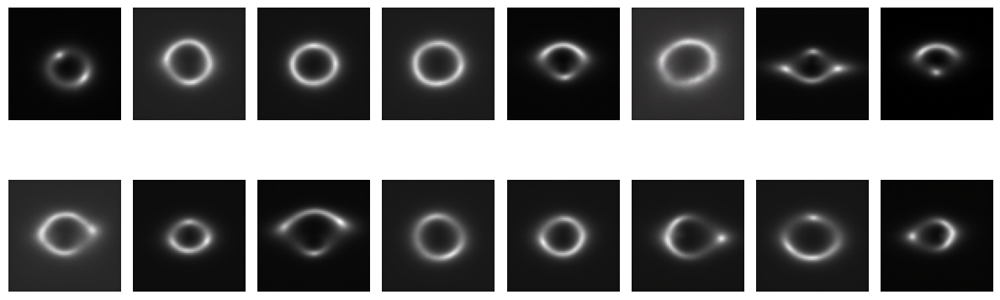

312/312 ━━━━━━━━━━━━━━━━━━━━ 230s 711ms/step - loss: 0.0017
Epoch 26/30
312/312 ━━━━━━━━━━━━━━━━━━━━ 0s 372ms/step - loss: 0.0015

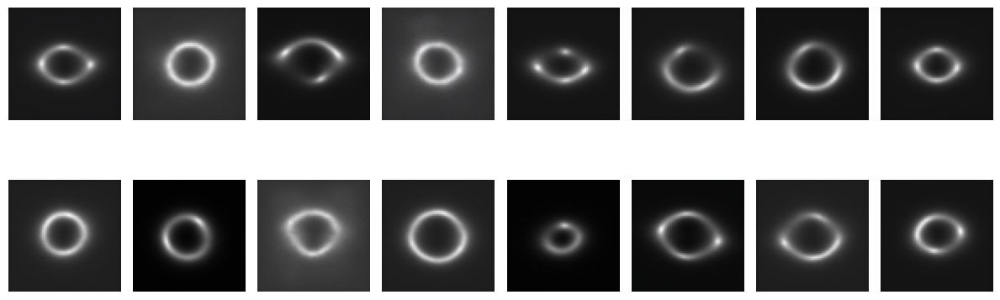

312/312 ━━━━━━━━━━━━━━━━━━━━ 230s 711ms/step - loss: 0.0015
Epoch 27/30
312/312 ━━━━━━━━━━━━━━━━━━━━ 0s 372ms/step - loss: 0.0013

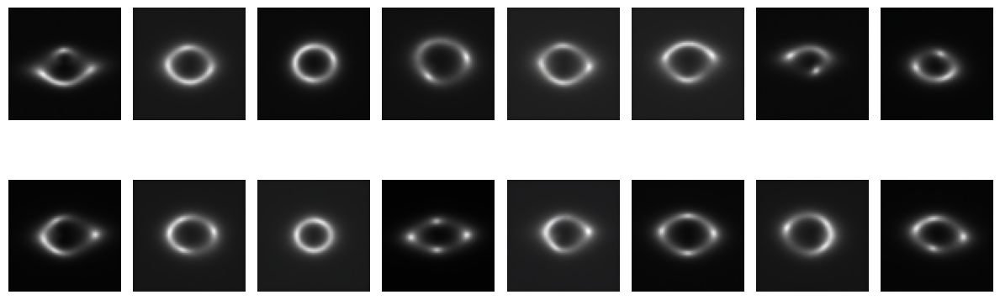

312/312 ━━━━━━━━━━━━━━━━━━━━ 231s 714ms/step - loss: 0.0013
Epoch 28/30
312/312 ━━━━━━━━━━━━━━━━━━━━ 0s 373ms/step - loss: 0.0015

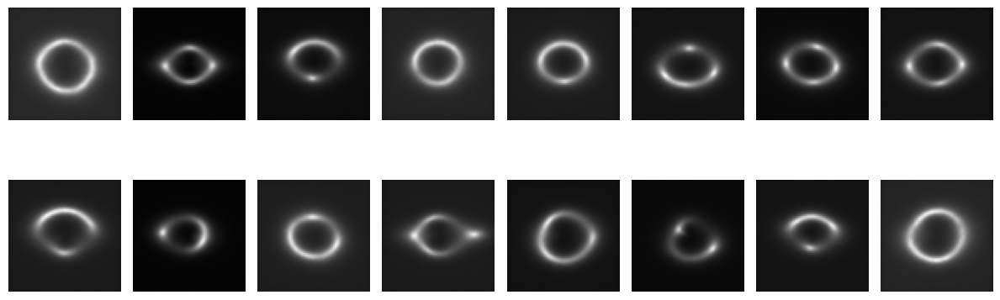

312/312 ━━━━━━━━━━━━━━━━━━━━ 234s 723ms/step - loss: 0.0015
Epoch 29/30
  1/312 ━━━━━━━━━━━━━━━━━━━━ 47:38 9s/step - loss: 0.0014

UnknownError: Graph execution error:

Detected at node EagerPyFunc defined at (most recent call last):
<stack traces unavailable>
Detected at node EagerPyFunc defined at (most recent call last):
<stack traces unavailable>
2 root error(s) found.
  (0) UNKNOWN:  InvalidArgumentError: {{function_node __wrapped__RealDiv_device_/job:localhost/replica:0/task:0/device:GPU:0}} required broadcastable shapes [Op:RealDiv] name: 
Traceback (most recent call last):

  File "/usr/local/lib/python3.10/dist-packages/tensorflow/python/ops/script_ops.py", line 268, in __call__
    return func(device, token, args)

  File "/usr/local/lib/python3.10/dist-packages/tensorflow/python/ops/script_ops.py", line 146, in __call__
    outputs = self._call(device, args)

  File "/usr/local/lib/python3.10/dist-packages/tensorflow/python/ops/script_ops.py", line 153, in _call
    ret = self._func(*args)

  File "/usr/local/lib/python3.10/dist-packages/tensorflow/python/autograph/impl/api.py", line 643, in wrapper
    return func(*args, **kwargs)

  File "<ipython-input-26-70aafe1d9707>", line 19, in load_and_process_npy
    img = resize_and_rescale(img, size=(img_size, img_size))

  File "<ipython-input-26-70aafe1d9707>", line 8, in resize_and_rescale
    img = tf.image.resize(img, size=size, antialias=True)

  File "/usr/local/lib/python3.10/dist-packages/tensorflow/python/util/traceback_utils.py", line 153, in error_handler
    raise e.with_traceback(filtered_tb) from None

  File "/usr/local/lib/python3.10/dist-packages/tensorflow/python/framework/ops.py", line 5983, in raise_from_not_ok_status
    raise core._status_to_exception(e) from None  # pylint: disable=protected-access

tensorflow.python.framework.errors_impl.InvalidArgumentError: {{function_node __wrapped__RealDiv_device_/job:localhost/replica:0/task:0/device:GPU:0}} required broadcastable shapes [Op:RealDiv] name: 


	 [[{{node EagerPyFunc}}]]
	 [[IteratorGetNext]]
	 [[IteratorGetNext/_2]]
  (1) UNKNOWN:  InvalidArgumentError: {{function_node __wrapped__RealDiv_device_/job:localhost/replica:0/task:0/device:GPU:0}} required broadcastable shapes [Op:RealDiv] name: 
Traceback (most recent call last):

  File "/usr/local/lib/python3.10/dist-packages/tensorflow/python/ops/script_ops.py", line 268, in __call__
    return func(device, token, args)

  File "/usr/local/lib/python3.10/dist-packages/tensorflow/python/ops/script_ops.py", line 146, in __call__
    outputs = self._call(device, args)

  File "/usr/local/lib/python3.10/dist-packages/tensorflow/python/ops/script_ops.py", line 153, in _call
    ret = self._func(*args)

  File "/usr/local/lib/python3.10/dist-packages/tensorflow/python/autograph/impl/api.py", line 643, in wrapper
    return func(*args, **kwargs)

  File "<ipython-input-26-70aafe1d9707>", line 19, in load_and_process_npy
    img = resize_and_rescale(img, size=(img_size, img_size))

  File "<ipython-input-26-70aafe1d9707>", line 8, in resize_and_rescale
    img = tf.image.resize(img, size=size, antialias=True)

  File "/usr/local/lib/python3.10/dist-packages/tensorflow/python/util/traceback_utils.py", line 153, in error_handler
    raise e.with_traceback(filtered_tb) from None

  File "/usr/local/lib/python3.10/dist-packages/tensorflow/python/framework/ops.py", line 5983, in raise_from_not_ok_status
    raise core._status_to_exception(e) from None  # pylint: disable=protected-access

tensorflow.python.framework.errors_impl.InvalidArgumentError: {{function_node __wrapped__RealDiv_device_/job:localhost/replica:0/task:0/device:GPU:0}} required broadcastable shapes [Op:RealDiv] name: 


	 [[{{node EagerPyFunc}}]]
	 [[IteratorGetNext]]
0 successful operations.
0 derived errors ignored. [Op:__inference_one_step_on_iterator_1899518]

In [31]:
epoch_losses = []

# Custom callback to save loss after each epoch
class TrackLossCallback(keras.callbacks.Callback):
    def on_epoch_end(self, epoch, logs=None):
        # Get the loss value and round it to 4 decimal places
        loss_value = logs.get("loss")
        if loss_value is not None:
            epoch_losses.append(round(loss_value, 4))  # Round to 4 decimal places


# Get the model
model = DiffusionModel(
    network=network,
    ema_network=ema_network,
    gdf_util=gdf_util,
    timesteps=total_timesteps,
)

# Compile the model
model.compile(
    loss=keras.losses.MeanSquaredError(),
    optimizer=keras.optimizers.Adam(learning_rate=learning_rate),
)

# Train the model
model.fit(
    train_ds,
    epochs=num_epochs,
    batch_size=batch_size,
    callbacks=[keras.callbacks.LambdaCallback(on_epoch_end=model.plot_images),
    TrackLossCallback()]
)

In [37]:
# import matplotlib.pyplot as plt
# import matplotlib.ticker as ticker

# # Sample data for epoch_losses (replace this with your actual data)
# # epoch_losses = [0.1234, 0.1123, 0.0987, 0.0876, 0.0754]  # Example data

# # Plot the training loss
# plt.figure(figsize=(8, 4))
# plt.plot(epoch_losses, marker='o', color='blue', label='Training Loss')

# # Set title and labels
# plt.title("Training Loss Over Epochs")
# plt.xlabel("Epoch")
# plt.ylabel("Loss (MSE)")

# # Format y-axis to show four decimal places
# plt.gca().yaxis.set_major_formatter(ticker.FormatStrFormatter('%.4f'))

# # Add grid, legend, and layout adjustments
# plt.grid(True)
# plt.legend()
# plt.tight_layout()

# # Save the figure
# plt.savefig("training_loss_curve.png")

# # Show the plot
# plt.show()

# FID

In [35]:
import numpy as np
import tensorflow as tf
from tensorflow.keras.applications.inception_v3 import InceptionV3, preprocess_input
from tensorflow.keras.models import Model
from scipy.linalg import sqrtm
import matplotlib.pyplot as plt

# ---- Load real images ----
real_images = np.load("/kaggle/input/diffusion-data/Samples/sample1.npy")
print("✅ Loaded real images:", real_images.shape)

# Fix shape if missing channel dimension (e.g., grayscale images)
if real_images.ndim == 3:
    real_images = np.expand_dims(real_images, axis=-1)  # (N, H, W) ➝ (N, H, W, 1)

# Normalize if needed
if real_images.max() > 1.0:
    real_images = real_images / 255.0

# Function to resize and convert to RGB if needed
def preprocess_images(images):
    images = tf.convert_to_tensor(images, dtype=tf.float32)
    images = tf.image.resize(images, (299, 299))
    if images.shape[-1] == 1:  # Convert grayscale to RGB
        images = tf.image.grayscale_to_rgb(images)
    elif images.shape[-1] != 3:
        raise ValueError(f"Expected image with 1 or 3 channels, but got {images.shape[-1]}")
    return images.numpy()

# Resize and convert real images
real_images_resized = preprocess_images(real_images)
print("✅ Preprocessed real images shape:", real_images_resized.shape)

# ---- Generate fake images using trained DiffusionModel ----
num_images = real_images.shape[0]
generated_images = model.generate_images(num_images=num_images)
generated_images = tf.clip_by_value(generated_images, 0.0, 1.0)
print("✅ Generated fake images:", generated_images.shape)

# Fix generated image shape if needed
if generated_images.ndim == 3:
    generated_images = tf.expand_dims(generated_images, axis=-1)  # (N, H, W) ➝ (N, H, W, 1)

generated_images_resized = preprocess_images(generated_images)
print("✅ Preprocessed generated images shape:", generated_images_resized.shape)

# ---- Duplicate if sample count is less than 2 ----
if real_images_resized.shape[0] < 2:
    real_images_resized = np.concatenate([real_images_resized] * 2, axis=0)
    print(f"📎 Duplicated real image to shape: {real_images_resized.shape}")

if generated_images_resized.shape[0] < 2:
    generated_images_resized = np.concatenate([generated_images_resized] * 2, axis=0)
    print(f"📎 Duplicated fake image to shape: {generated_images_resized.shape}")

# ---- Load InceptionV3 for feature extraction ----
inception_model = InceptionV3(include_top=False, weights='imagenet', pooling='avg', input_shape=(299, 299, 3))
inception_model.trainable = False

# Extract activations from InceptionV3
def get_activations(images):
    images = preprocess_input(images * 255.0)  # Rescale to match InceptionV3 expectations
    return inception_model.predict(images, batch_size=32, verbose=0)

# Extract features
act_real = get_activations(real_images_resized)
act_fake = get_activations(generated_images_resized)
print("✅ Activation shapes - real:", act_real.shape, "fake:", act_fake.shape)

# Compute means and covariances
mu_real, sigma_real = act_real.mean(axis=0), np.cov(act_real, rowvar=False)
mu_fake, sigma_fake = act_fake.mean(axis=0), np.cov(act_fake, rowvar=False)

# Fix shapes if covariance degenerates to scalar
if sigma_real.ndim != 2:
    print("⚠️ Warning: sigma_real was not 2D. Replacing with identity matrix.")
    sigma_real = np.eye(act_real.shape[1])
if sigma_fake.ndim != 2:
    print("⚠️ Warning: sigma_fake was not 2D. Replacing with identity matrix.")
    sigma_fake = np.eye(act_fake.shape[1])

print("✅ mu_real shape:", mu_real.shape, "| sigma_real shape:", sigma_real.shape)
print("✅ mu_fake shape:", mu_fake.shape, "| sigma_fake shape:", sigma_fake.shape)

# ---- Compute FID ----
def calculate_fid(mu1, sigma1, mu2, sigma2):
    """Compute the Fréchet Inception Distance (FID)."""
    ssdiff = np.sum((mu1 - mu2)**2.0)
    covmean = sqrtm(sigma1 @ sigma2)
    if np.iscomplexobj(covmean):
        covmean = covmean.real
    return ssdiff + np.trace(sigma1 + sigma2 - 2.0 * covmean)

# Final FID computation
fid_score = calculate_fid(mu_real, sigma_real, mu_fake, sigma_fake)
print("🎯 FID Score:", fid_score)


✅ Loaded real images: (1, 150, 150)
✅ Preprocessed real images shape: (1, 299, 299, 3)
✅ Generated fake images: (1, 64, 64, 3)
✅ Preprocessed generated images shape: (1, 299, 299, 3)
📎 Duplicated real image to shape: (2, 299, 299, 3)
📎 Duplicated fake image to shape: (2, 299, 299, 3)
✅ Activation shapes - real: (2, 2048) fake: (2, 2048)
✅ mu_real shape: (2048,) | sigma_real shape: (2048, 2048)
✅ mu_fake shape: (2048,) | sigma_fake shape: (2048, 2048)
🎯 FID Score: 178.83457946777344


# Result

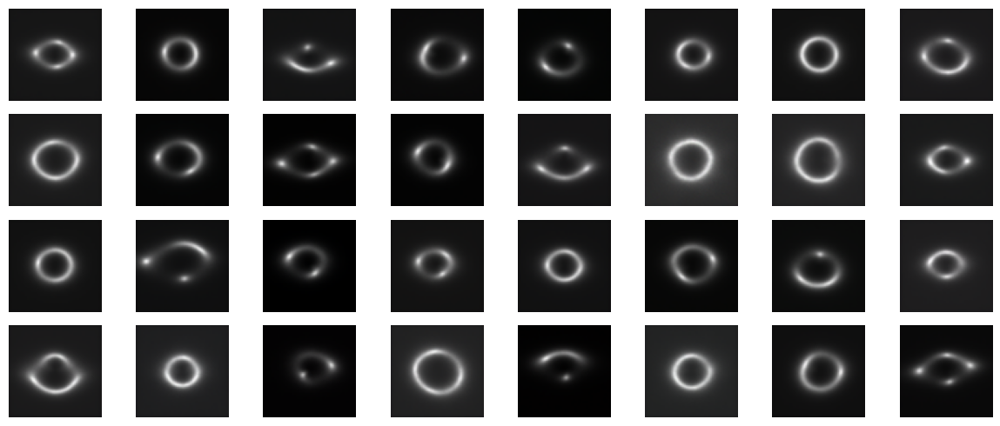

In [36]:
# Save the model weights in a compatible format
model.ema_network.save_weights("diffusion_model_checkpoint.weights.h5")

# Load the model weights from the new file
model.ema_network.load_weights("diffusion_model_checkpoint.weights.h5")

# Generate and plot some samples
model.plot_images(num_rows=4, num_cols=8)